In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="8jH2f4reQGuyuvJ5QHEg")
project = rf.workspace("huangzixuan").project("drugs-detection")
version = project.version(3)
dataset = version.download("yolov7")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to drugs-detection-3 in yolov7pytorch:: 100%|██████████| 5392/5392 [00:00<00:00, 5761.23it/s]


In [ ]:
# # Create the directory if it doesn't exist
# !mkdir -p /content/yolov7
# # Change to the /content/yolov7 directory
# %cd /content/yolov7
# # Download the COCO starting checkpoint for YOLOv7
# !wget "https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7.pt
%cd /content
!git clone https://github.com/WongKinYiu/yolov7.git

/content
fatal: destination path 'yolov7' already exists and is not an empty directory.


In [ ]:
%cd /content/yolov7
!python train.py --batch 8 --cfg cfg/training/yolov7.yaml --epochs 30 --data {dataset.location}/data.yaml --weights 'yolov7.pt' --device 0

/content/yolov7
2024-10-26 08:14:49.906233: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-26 08:14:49.943235: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-26 08:14:49.953428: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-26 08:14:50.001611: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-10-26 08:14:53.419108: W tensorf

In [ ]:
import os

# List all experiment directories
print("Experiment Directories:", os.listdir("runs/train"))

# Get the most recent experiment directory by sorting by modification time
exp_dirs = [d for d in os.listdir("runs/train") if os.path.isdir(os.path.join("runs/train", d))]
EXP_DIR = max(exp_dirs, key=lambda d: os.path.getmtime(os.path.join("runs/train", d)))

# Verify if 'best.pt' exists
exp_path = os.path.join("runs/train", EXP_DIR, "weights")
print("Weights Directory:", exp_path)
print("Contents:", os.listdir(exp_path))

# Check if best.pt exists before running detection
weights_path = os.path.join(exp_path, "best.pt")
if os.path.exists(weights_path):
    # Run detection
    !python detect.py --weights {weights_path} --conf 0.1 --source {dataset.location}/test/images
else:
    print("Weights file 'best.pt' does not exist.")


Experiment Directories: ['exp2', 'exp3', 'exp']
Weights Directory: runs/train/exp3/weights
Contents: ['epoch_027.pt', 'last.pt', 'epoch_024.pt', 'epoch_029.pt', 'init.pt', 'epoch_000.pt', 'epoch_026.pt', 'best.pt', 'epoch_025.pt', 'epoch_028.pt']
Namespace(weights=['runs/train/exp3/weights/best.pt'], source='/content/yolov7/drugs-detection-3/test/images', img_size=640, conf_thres=0.1, iou_thres=0.45, device='', view_img=False, save_txt=False, save_conf=False, nosave=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', exist_ok=False, no_trace=False)
YOLOR 🚀 v0.1-128-ga207844 torch 2.5.0+cu121 CUDA:0 (Tesla T4, 15102.0625MB)

/content/yolov7/models/experimental.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com

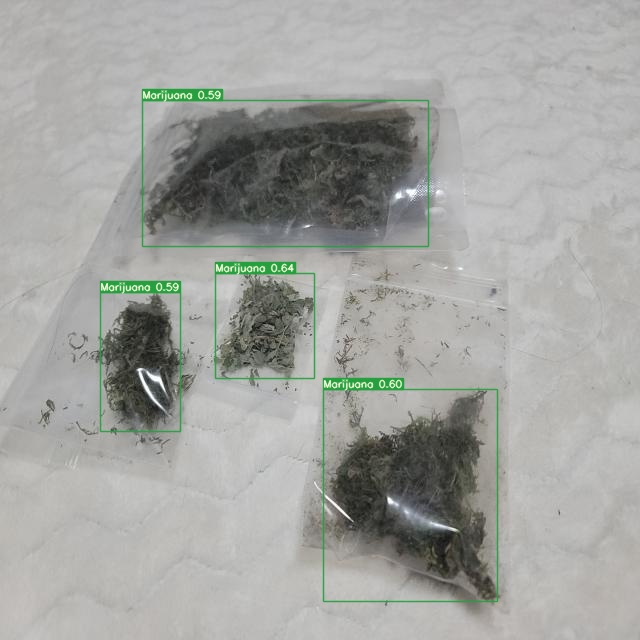

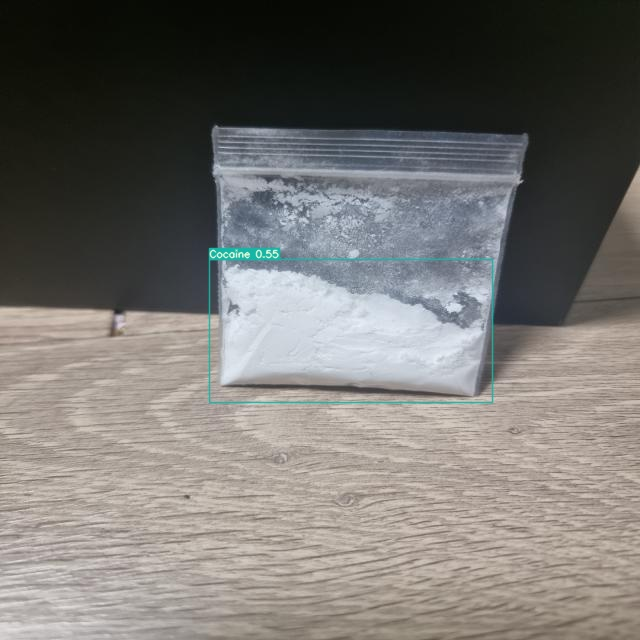

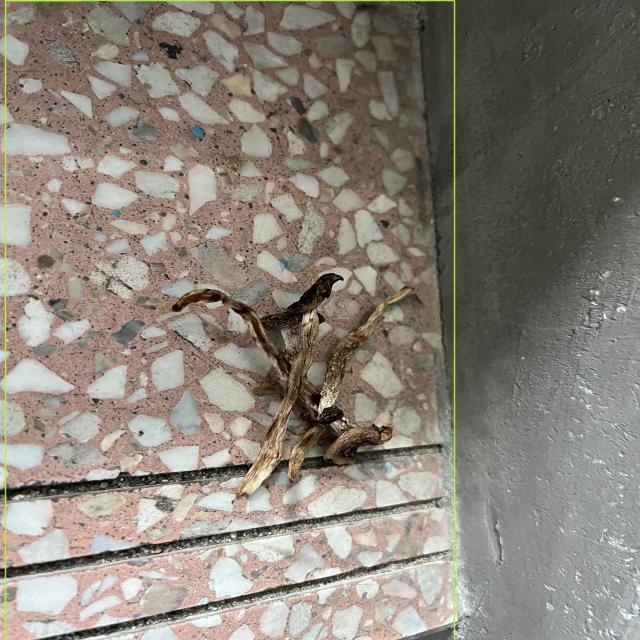

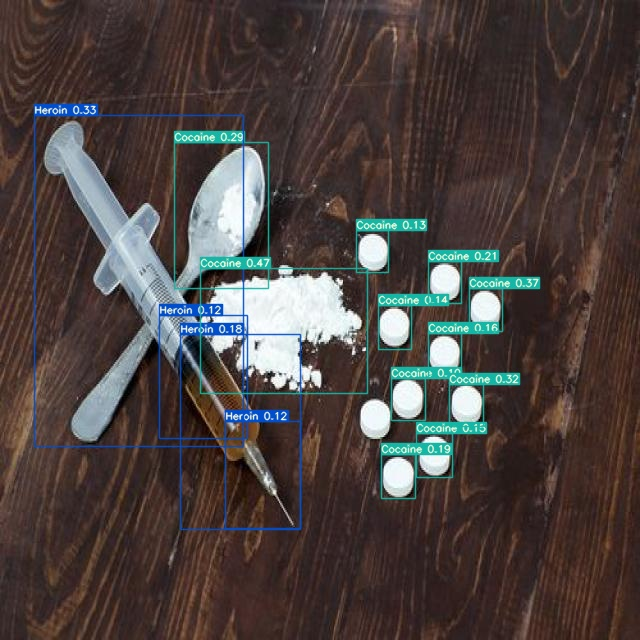

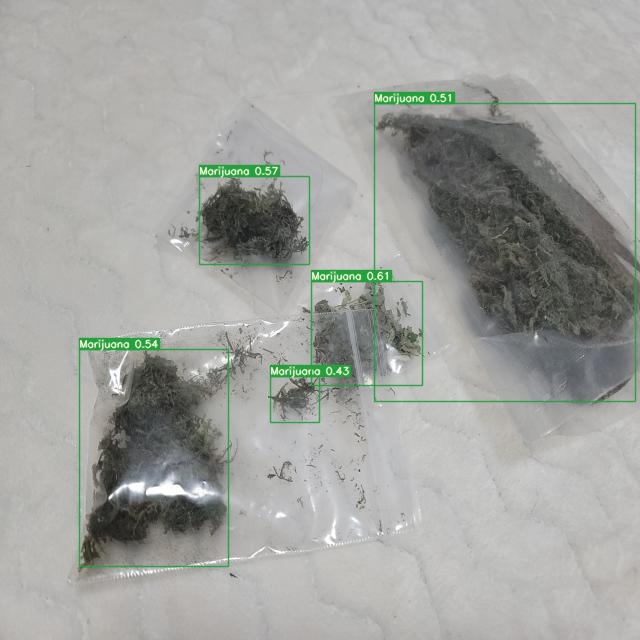

...

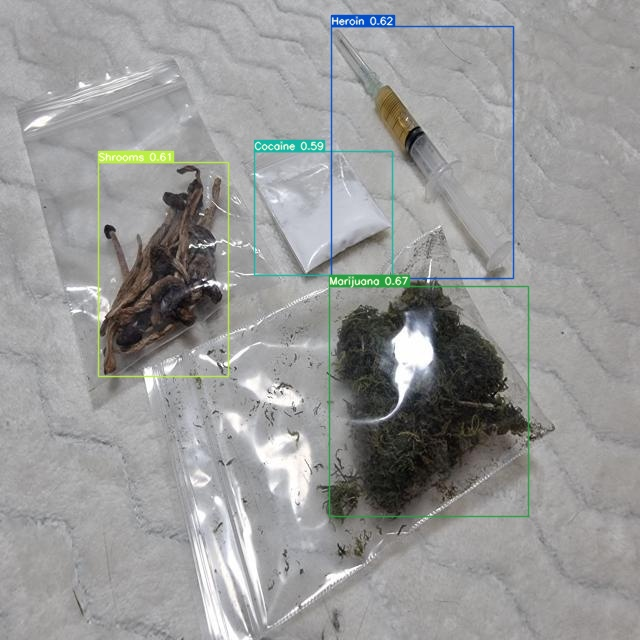

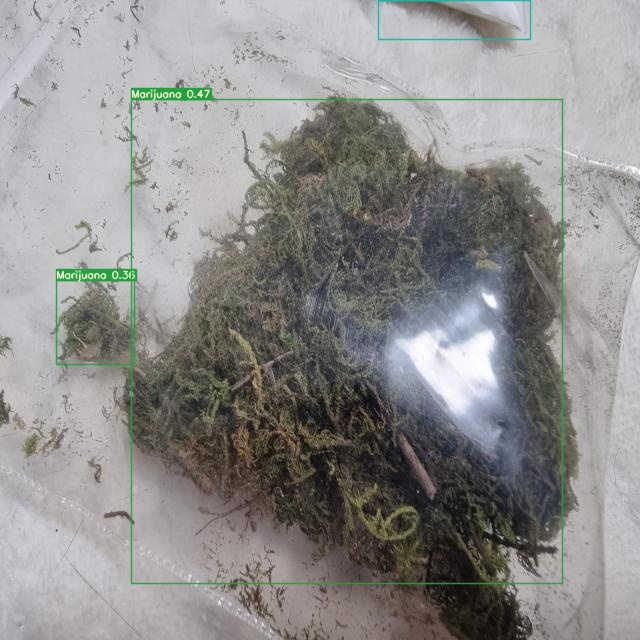

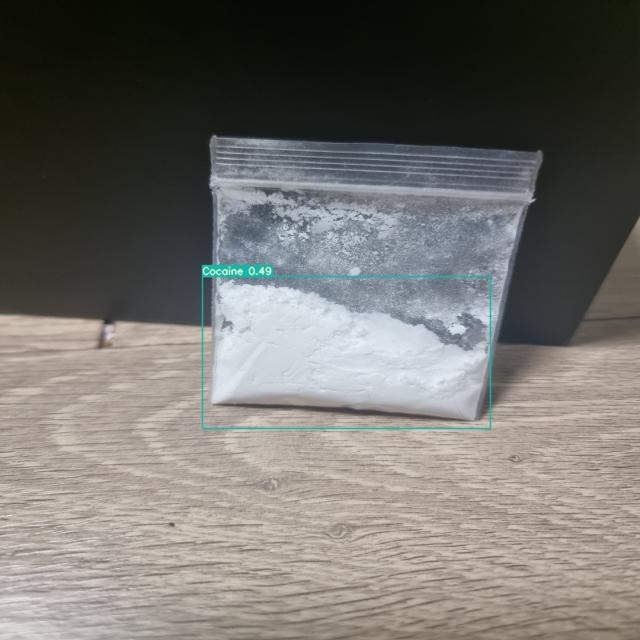

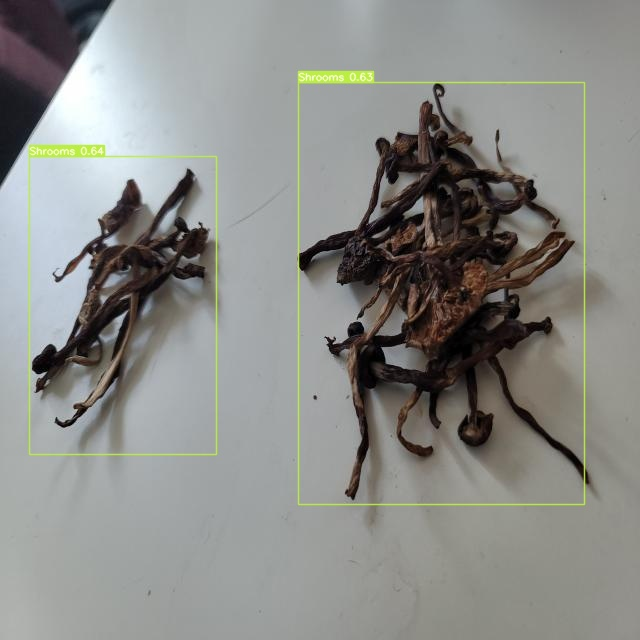

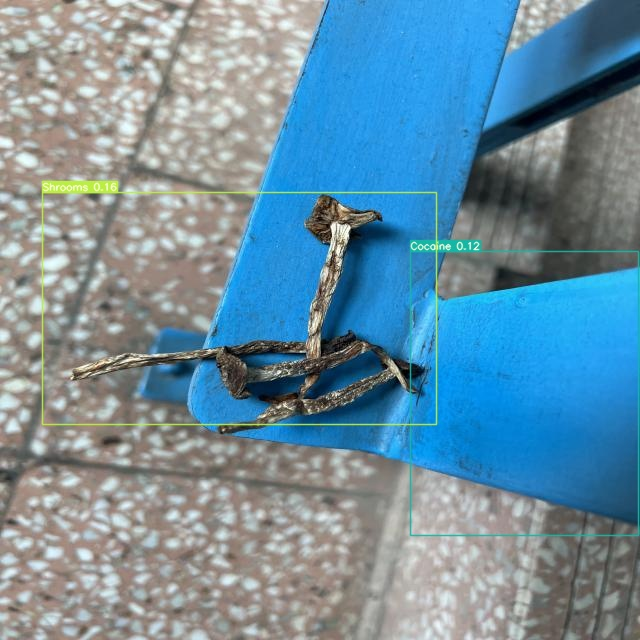

In [ ]:
HOME = "/content"
import os
import glob
from IPython.display import Image, display

# Set HOME path
HOME = "/content"

# Get the directory containing the most recent detection run
EXP_DIR = sorted(os.listdir("runs/detect"), key=lambda x: int(x.replace("exp", "") or 0))[-1]

i = 0
limit = 10000  # max images to display
for imageName in glob.glob(f"{HOME}/yolov7/runs/detect/{EXP_DIR}/*.jpg"):  # assuming JPG format
    if i < limit:
        display(Image(filename=imageName))
        print("\n")
    i += 1

